# DAGM 2007 dataset 다운로드

In [28]:
import os, cv2, glob, wget, shutil
import numpy as np
import zipfile
import random
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# base_dir = '/content'
base_dir = r'C:\Users\HP\Documents\code_ws\vision_ws\DAGM2007'

In [6]:
os.chdir(base_dir)

for i in range(1,3):
  zip_name = f'Class{i}.zip'
  zip_name_def = f'Class{i}_def.zip'
  url = f'https://conferences.mpi-inf.mpg.de/dagm/2007/Class{i}.zip'
  url_def = f'https://conferences.mpi-inf.mpg.de/dagm/2007/Class{i}_def.zip'
  if not os.path.exists(zip_name):
    # !wget $url_def
    wget.download(url)
  if not os.path.exists(zip_name_def):
    # !wget $url_def
    wget.download(url_def)

In [7]:
os.chdir(base_dir)

zipfiles = glob.glob('*.zip')
for zipfile in zipfiles:
  dir_name = zipfile.replace('.zip', '')
  if not os.path.exists(dir_name):
    # !unzip $zipfile
    # os.system(f'unzip {zipfile}')
    shutil.unpack_archive(zipfile)

# class 선언

In [32]:
class CV2Preprocessor:
    def __init__(self, img):
        if img is None:
            raise ValueError("이미지가 None입니다.")
        self.img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img

        # 파라미터 설정
        self.params = {
            "canny_thresh1": 100,
            "canny_thresh2": 200,
            "gaussian_ksize": 5,
            "adaptive_blocksize": 11,
            "adaptive_C": 2,
            "sobel_ksize": 3
        }

        # 사용할 필터 리스트
        self.filter_list = [
            self.equalize_hist,
            self.gaussian_blur,
            self.canny,
            self.dilate,
            self.adaptive_thresh,
            self.laplacian,
            self.sobel_filter  # 추가된 필터
        ]

    def original_img(self, img):
      return ("origin", img)

    def equalize_hist(self, img):
      title = 'equ'
      return title, cv2.equalizeHist(img)

    def gaussian_blur(self, img):
      title = 'gaussian'
      ksize = self.params["gaussian_ksize"]
      return title, cv2.GaussianBlur(img, (ksize, ksize), 0)

    def canny(self, img):
      title = 'canny'
      t1 = self.params["canny_thresh1"]
      t2 = self.params["canny_thresh2"]
      return title, cv2.Canny(img, t1, t2)

    def dilate(self, img):
      title = 'diate'
      kernel = np.ones((3, 3), np.uint8)
      return title, cv2.dilate(img, kernel, iterations=1)

    def adaptive_thresh(self, img):
      title = 'adaptive'
      return title, cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY, self.params["adaptive_blocksize"], self.params["adaptive_C"])

    def laplacian(self, img):
      title = 'laplacian'
      return title, cv2.Laplacian(img, cv2.CV_64F)

    def sobel_filter(self, img):
      title = 'sobel'
      ksize = self.params["sobel_ksize"]
      sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
      sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
      magnitude = cv2.magnitude(sobelx, sobely)
      return title, np.uint8(np.clip(magnitude, 0, 255))

    def apply_filters(self):
      result = self.img.copy()
      title = ''
      self.filter_list = self.filter_list if self.filter_list else [self.original_img]
      for fil in self.filter_list:
        name, result = fil(result)
        title = name if title=='' else title + ' + ' + name
      return title, result

    def evaluate_image(self, img):
      """전처리된 이미지의 sharpness를 기반으로 평가"""
      laplacian_var = cv2.Laplacian(img, cv2.CV_64F).var()
      return laplacian_var  # 값이 높을수록 경계가 뚜렷

    def show_all(self):
      temp = self.img.copy()
      for f in self.filter_list:
          temp = f(temp)
          score = self.evaluate_image(temp)
          name = f.__name__
          print(f"{name} → Sharpness: {score:.2f}")
          cv2.imshow(name, temp)
          cv2.waitKey(0)
      cv2.destroyAllWindows()

    def plt_show(self, image, title, show_origin=True):
      plt_imgs = [self.img, image] if show_origin else [image]
      title = ['origin', title] if show_origin else [title]

      for i in range(len(plt_imgs)):
        plt.subplot(1, len(plt_imgs), i+1)
        plt.imshow(plt_imgs[i], cmap='gray')
        plt.title(title[i], fontsize=8)
        plt.axis('off')
      plt.tight_layout()
      plt.show()

    def apply_filters_with_slide(
      self, use_eq, eq_hist,
      use_blur, blur_ksize,
      use_canny, canny1, canny2,
      use_dilate, dilate_iter,
      use_adaptive, adaptive_block, adaptive_C,
      use_laplacian, laplacian_ksize
      ):
      processed = self.img.copy()

      if use_eq and eq_hist:
          processed = cv2.equalizeHist(processed)

      if use_blur and blur_ksize > 0:
          k = blur_ksize * 2 + 1
          processed = cv2.GaussianBlur(processed, (k, k), 0)

      if use_canny and canny1 > 0 and canny2 > 0:
          processed = cv2.Canny(processed, canny1, canny2)

      if use_dilate and dilate_iter > 0:
          kernel = np.ones((3, 3), np.uint8)
          processed = cv2.dilate(processed, kernel, iterations=dilate_iter)

      if use_adaptive and adaptive_block % 2 == 1 and adaptive_block >= 3:
          try:
              processed = cv2.adaptiveThreshold(processed, 255,
                                                cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                cv2.THRESH_BINARY,
                                                adaptive_block, adaptive_C)
          except:
              pass

      if use_laplacian and laplacian_ksize > 0:
          k = laplacian_ksize * 2 + 1
          processed = cv2.Laplacian(processed, cv2.CV_64F, ksize=k)
          processed = cv2.convertScaleAbs(processed)

      # 출력
      plt.figure(figsize=(6, 6))
      plt.imshow(processed, cmap='gray')
      plt.title('Filtered Output')
      plt.axis('off')
      plt.show()

    def show_widget(self):
      ui = widgets.VBox([
          widgets.HBox([widgets.Checkbox(value=False, description='Use Equalize'), widgets.Checkbox(value=False, description='Equalize Hist')]),
          widgets.HBox([widgets.Checkbox(value=False, description='Use Blur'), widgets.IntSlider(value=1, min=0, max=10, description='Blur Ksize')]),
          widgets.HBox([widgets.Checkbox(value=False, description='Use Canny'),
                        widgets.IntSlider(value=100, min=0, max=255, description='Canny Th1'),
                        widgets.IntSlider(value=200, min=0, max=255, description='Canny Th2')]),
          widgets.HBox([widgets.Checkbox(value=False, description='Use Dilate'), widgets.IntSlider(value=0, min=0, max=5, description='Dilate Iter')]),
          widgets.HBox([widgets.Checkbox(value=False, description='Use Adaptive'),
                        widgets.IntSlider(value=11, min=3, max=25, step=2, description='Block Size'),
                        widgets.IntSlider(value=2, min=-10, max=10, description='C value')]),
          widgets.HBox([widgets.Checkbox(value=False, description='Use Laplacian'), widgets.IntSlider(value=1, min=0, max=5, description='Laplacian Ksize')]),
      ])

      out = widgets.interactive_output(self.apply_filters_with_slide, {
          'use_eq': ui.children[0].children[0],
          'eq_hist': ui.children[0].children[1],
          'use_blur': ui.children[1].children[0],
          'blur_ksize': ui.children[1].children[1],
          'use_canny': ui.children[2].children[0],
          'canny1': ui.children[2].children[1],
          'canny2': ui.children[2].children[2],
          'use_dilate': ui.children[3].children[0],
          'dilate_iter': ui.children[3].children[1],
          'use_adaptive': ui.children[4].children[0],
          'adaptive_block': ui.children[4].children[1],
          'adaptive_C': ui.children[4].children[2],
          'use_laplacian': ui.children[5].children[0],
          'laplacian_ksize': ui.children[5].children[1],
      })

      display(ui, out)

In [2]:
# ------------------------- 이미지 로딩 및 샘플링 클래스 -------------------------
class ImageShow:
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.selected_images = []

    def random_sample_imgs(self, n: int, show_plot: bool = True, extension: str = '*.png'):
        os.chdir(os.path.join(base_dir, self.folder_path))
        files = glob.glob(extension)
        if not files:
            raise FileNotFoundError("해당 확장자의 이미지가 존재하지 않습니다.")
        self.selected_images = random.sample(files, min(n, len(files)))

        if show_plot:
            plt.figure(figsize=(8, 6))
            for idx, path in enumerate(self.selected_images, 1):
                img = cv2.imread(path)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                plt.subplot(1, n, idx)
                plt.imshow(img_rgb)
                plt.title(os.path.basename(path))
                plt.axis('off')
            plt.tight_layout()
            plt.show()

In [3]:
# ------------------------- 시각화 함수 -------------------------
def plot_preprocessing_results(results, figsize=(15, 3), cmap='gray'):
    plt.figure(figsize=figsize)
    for i, (title, image) in enumerate(results, 1):
        plt.subplot(1, len(results), i)
        plt.imshow(image, cmap=cmap)
        plt.title(title, fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Class1 전처리

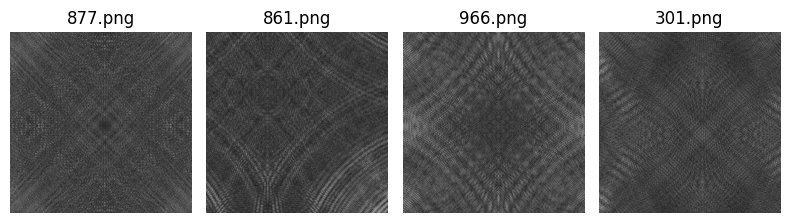

In [16]:
img_show = ImageShow('Class1')  # 폴더 이름 지정
img_show.random_sample_imgs(n=4, show_plot=True)

## equalize_hist + gaussian + alpha

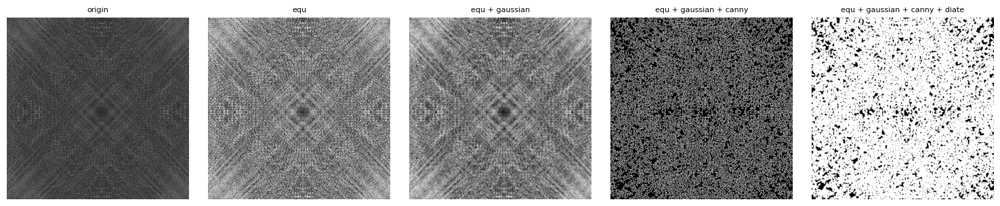

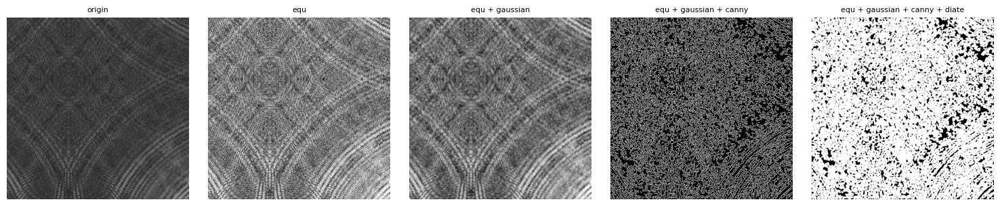

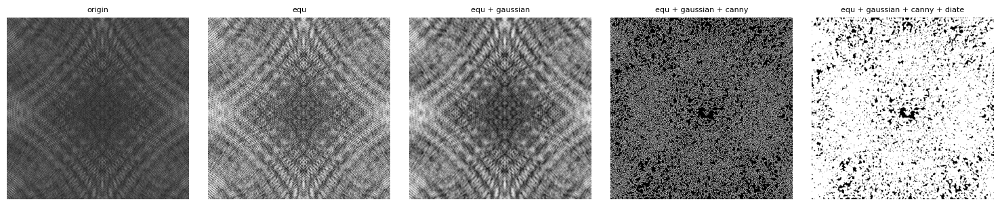

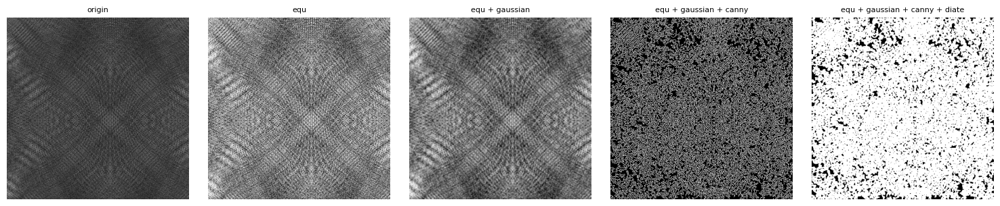

In [18]:
for path in img_show.selected_images:
    img = cv2.imread(path)
    processor = CV2Preprocessor(img)
    filters = []
    results = []
    filter0 = []
    filter1 = [processor.equalize_hist]
    filter2 = [processor.equalize_hist, processor.gaussian_blur]
    filter3 = [processor.equalize_hist, processor.gaussian_blur, processor.canny]
    filter4 = [processor.equalize_hist, processor.gaussian_blur, processor.canny, processor.dilate]
    filters = [filter0, filter1, filter2, filter3, filter4]

    for fil in filters:
        processor.filter_list = fil
        results.append(processor.apply_filters())

    plot_preprocessing_results(results)

## sobel + alpha

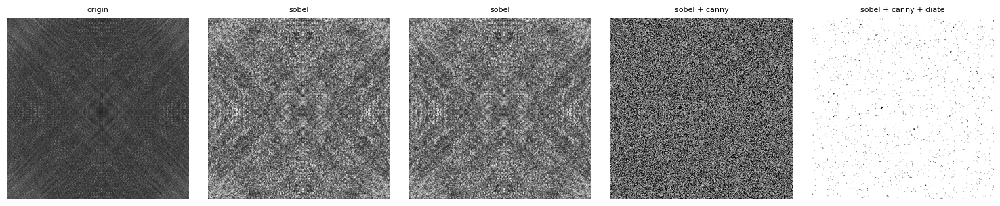

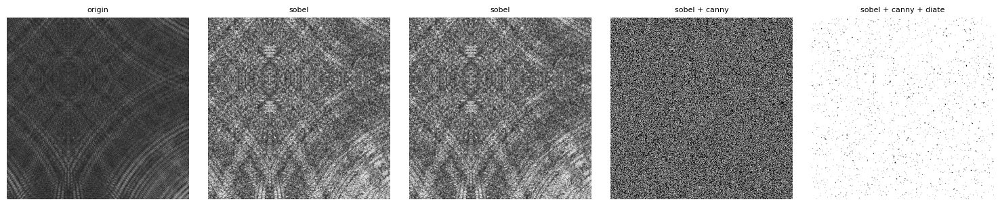

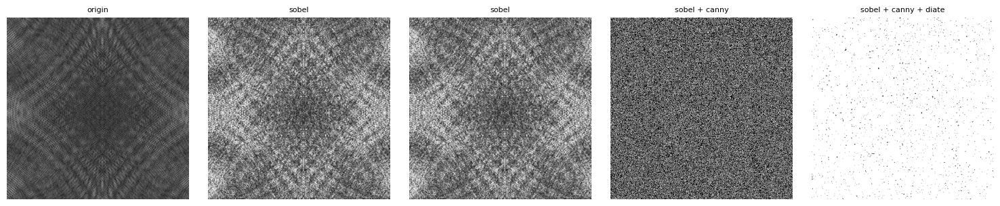

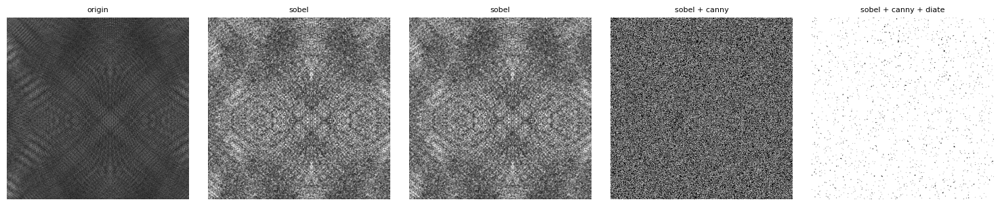

In [19]:
for path in img_show.selected_images:
    img = cv2.imread(path)
    processor = CV2Preprocessor(img)
    filters = []
    results = []
    filter0 = []
    filter1 = [processor.sobel_filter]
    filter2 = [processor.sobel_filter]
    filter3 = [processor.sobel_filter, processor.canny]
    filter4 = [processor.sobel_filter, processor.canny, processor.dilate]
    filters = [filter0, filter1, filter2, filter3, filter4]

    for fil in filters:
        processor.filter_list = fil
        results.append(processor.apply_filters())

    plot_preprocessing_results(results)

# Class1_def 전처리

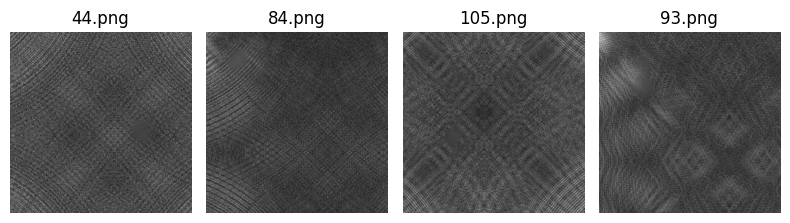

In [20]:
img_show = ImageShow('Class1_def')  # 폴더 이름 지정
img_show.random_sample_imgs(n=4, show_plot=True)

## equalize_hist + gaussian + alpha

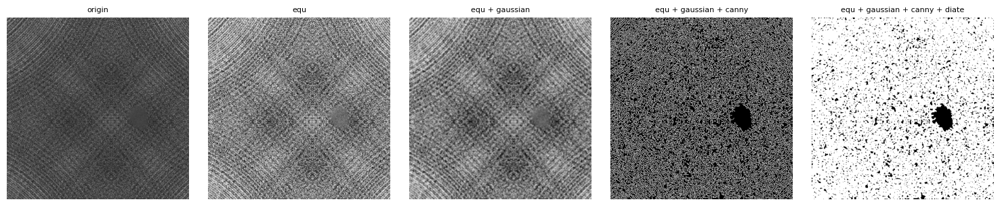

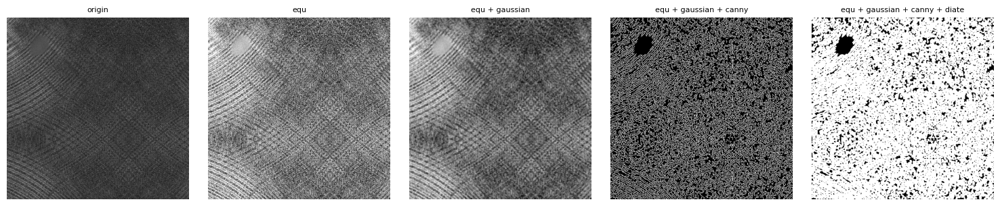

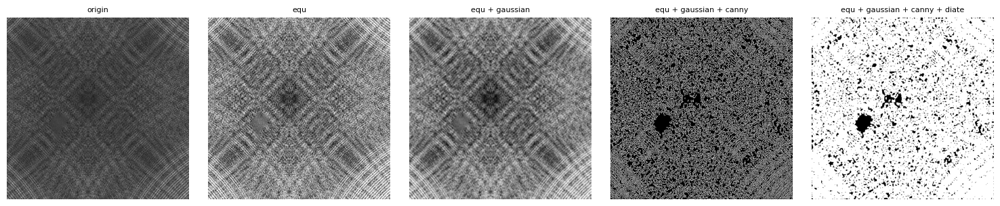

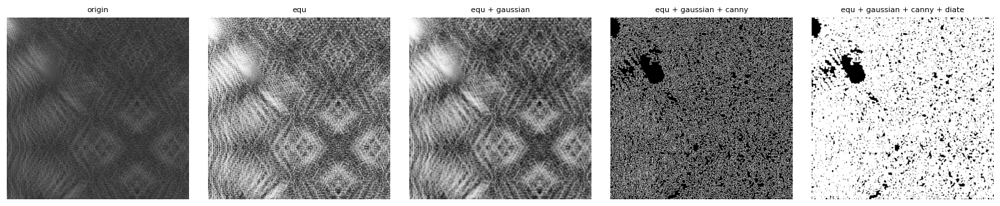

In [21]:
for path in img_show.selected_images:
    img = cv2.imread(path)
    processor = CV2Preprocessor(img)
    filters = []
    results = []
    filter0 = []
    filter1 = [processor.equalize_hist]
    filter2 = [processor.equalize_hist, processor.gaussian_blur]
    filter3 = [processor.equalize_hist, processor.gaussian_blur, processor.canny]
    filter4 = [processor.equalize_hist, processor.gaussian_blur, processor.canny, processor.dilate]
    filters = [filter0, filter1, filter2, filter3, filter4]

    for fil in filters:
        processor.filter_list = fil
        results.append(processor.apply_filters())

    plot_preprocessing_results(results)

## sobel + alpha

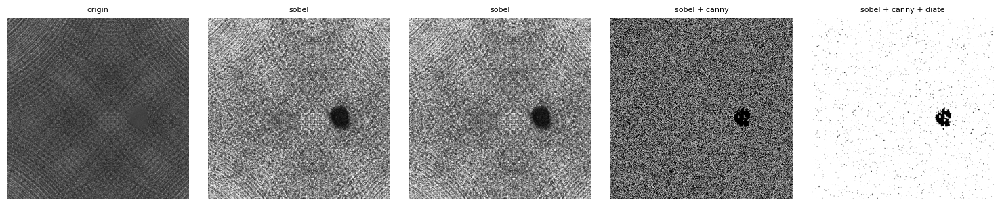

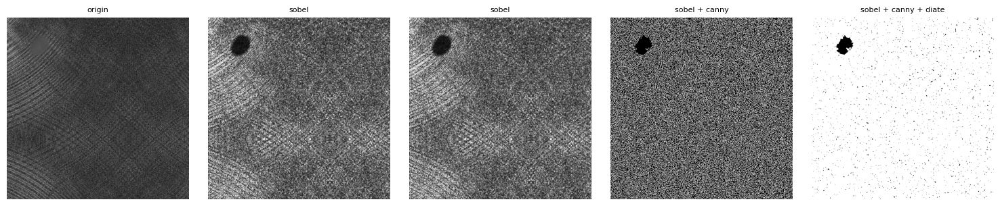

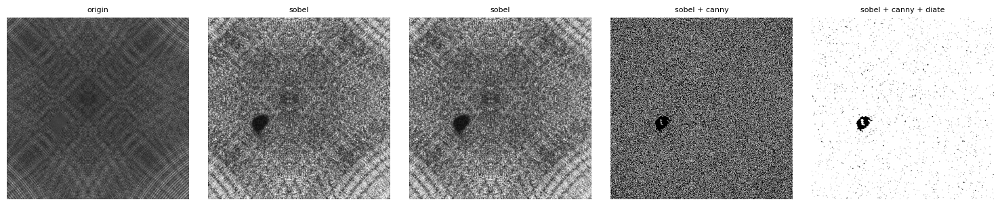

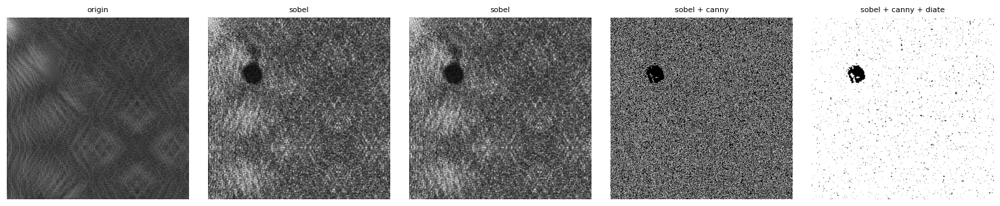

In [22]:
for path in img_show.selected_images:
    img = cv2.imread(path)
    processor = CV2Preprocessor(img)
    filters = []
    results = []
    filter0 = []
    filter1 = [processor.sobel_filter]
    filter2 = [processor.sobel_filter]
    filter3 = [processor.sobel_filter, processor.canny]
    filter4 = [processor.sobel_filter, processor.canny, processor.dilate]
    filters = [filter0, filter1, filter2, filter3, filter4]

    for fil in filters:
        processor.filter_list = fil
        results.append(processor.apply_filters())

    plot_preprocessing_results(results)

# 필터 조합

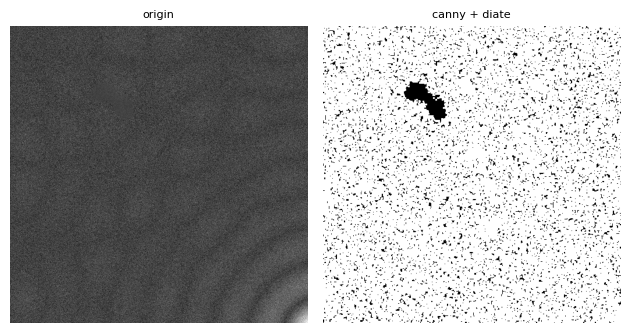

In [10]:
img_show = ImageShow('Class1_def')  # 폴더 이름 지정
img_show.random_sample_imgs(n=1, show_plot=False)

# img = img_show.selected_images[0]
img = os.path.join(base_dir,'Class1_def/14.png')
img = cv2.imread(img)
processor = CV2Preprocessor(img)
processor.params.update({"canny_thresh1": 85, "canny_thresh2": 88})
# processor.filter_list = [processor.equalize_hist, processor.gaussian_blur, processor.canny, processor.dilate]
processor.filter_list = [processor.canny, processor.dilate]
title, image = processor.apply_filters()
processor.plt_show(image, title, True)

In [23]:
processor.params

{'canny_thresh1': 100,
 'canny_thresh2': 200,
 'gaussian_ksize': 5,
 'adaptive_blocksize': 11,
 'adaptive_C': 2,
 'sobel_ksize': 3}

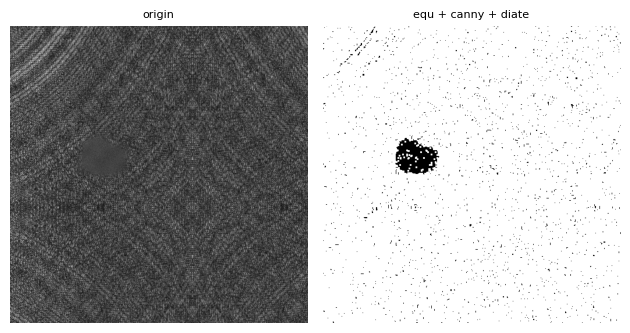

In [35]:
img_show = ImageShow('Class1_def')  # 폴더 이름 지정
img_show.random_sample_imgs(n=1, show_plot=False)

img = img_show.selected_images[0]
# img = os.path.join(base_dir,'Class1_def/73.png')
img = cv2.imread(img)
processor = CV2Preprocessor(img)
processor.params.update({"canny_thresh1": 245, "canny_thresh2": 250})
processor.filter_list = [processor.equalize_hist, processor.canny, processor.dilate]
# processor.filter_list = [processor.equalize_hist]
title, image = processor.apply_filters()

processor.plt_show(image, title, True)

In [36]:
processor.show_widget()

Output()

In [50]:
processor.evaluate_image(image)

np.float64(16294.6938590463)

# Class2 전처리

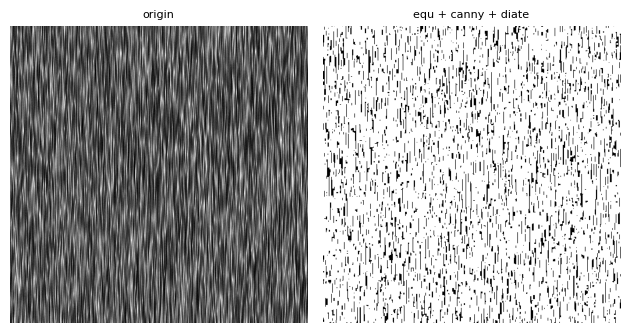

In [19]:
img_show = ImageShow('Class2')  # 폴더 이름 지정
img_show.random_sample_imgs(n=1, show_plot=False)

img = img_show.selected_images[0]
# img = os.path.join(base_dir,'Class1_def/73.png')
img = cv2.imread(img)
processor2 = CV2Preprocessor(img)
processor2.params.update({"canny_thresh1": 245, "canny_thresh2": 250})
processor2.filter_list = [processor2.equalize_hist ,processor2.canny, processor2.dilate]

title, image = processor2.apply_filters()
processor2.plt_show(image, title, True)

# Class2_def 전처리

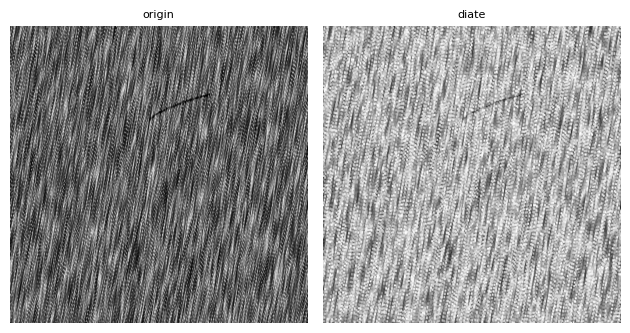

In [37]:
img_show = ImageShow('Class2_def')  # 폴더 이름 지정
img_show.random_sample_imgs(n=1, show_plot=False)

# img = img_show.selected_images[0]
img = os.path.join(base_dir,'Class2_def/73.png')
img = cv2.imread(img)
processor2 = CV2Preprocessor(img)
processor2.params.update({"canny_thresh1": 245, "canny_thresh2": 250})
processor2.filter_list = [processor2.dilate]
# processor2.filter_list = []

title, image = processor2.apply_filters()
processor2.plt_show(image, title, True)

In [38]:
processor2.show_widget()

Output()